In [1]:
import tensorflow as tf
print("GPU Available:", tf.config.list_physical_devices('GPU'))


GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
!nvidia-smi


Wed Mar  5 09:36:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P0             26W /  250W |       3MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install shap lime opencv-python tensorflow matplotlib


# **Importing the required libraries**

In [3]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow 
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline
 
from sklearn.model_selection import train_test_split
 
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# **Visualize the Data**

In [7]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [8]:
# Classes Directories
NonViolnceVideos_Dir = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Play Random Non Violence Video**

In [9]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Play Random Violence Video**

In [10]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

# **Extracting Frames**

In [12]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16
 

DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"
 
CLASSES_LIST = ["NonViolence","Violence"]

In [13]:
def frames_extraction(video_path):
 
    frames_list = []
    
    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)
 
    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
 
    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        # Reading the frame from the video. 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
 
    video_reader.release()
 
    return frames_list

# **Creating the Data**

In [15]:
def create_dataset():
 
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
 
            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)
 
            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:
 
                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
 
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels, video_files_paths

In [17]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence


[h264 @ 0x5c1a751ffc00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5c1a751ffc00] error while decoding MB 98 31
[h264 @ 0x5c1a751ffc00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5c1a751ffc00] error while decoding MB 98 31
[h264 @ 0x5c1a751ffc00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5c1a751ffc00] error while decoding MB 98 31
[h264 @ 0x5c1a751ffc00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5c1a751ffc00] error while decoding MB 98 31


Extracting Data of Class: Violence


In [19]:
# Saving the extracted data
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [20]:
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

# **Encoding and Splitting Training-Testing Sets**

In [22]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [23]:
# Split the Data into Train ( 90% ) and Test Set ( 10% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)

In [25]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1800, 16, 64, 64, 3) (1800, 2)
(200, 16, 64, 64, 3) (200, 2)


# **Importing MobileNet and Fine-Tuning it.**

In [32]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

mobilenet.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         input_4[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, None, None, 3 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

# **Building The Model**

In [33]:
def create_model():
 
    model = Sequential()

    ########################################################################################################################
    
    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))
    
    model.add(Dropout(0.25))
                                    
    model.add(TimeDistributed(Flatten()))

    
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)  

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))
    
    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
 
    ########################################################################################################################
 
    model.summary()
    
    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 16, 2, 2, 1280)    2257984   
_________________________________________________________________
dropout (Dropout)            (None, 16, 2, 2, 1280)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 16, 5120)          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                1319168   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0

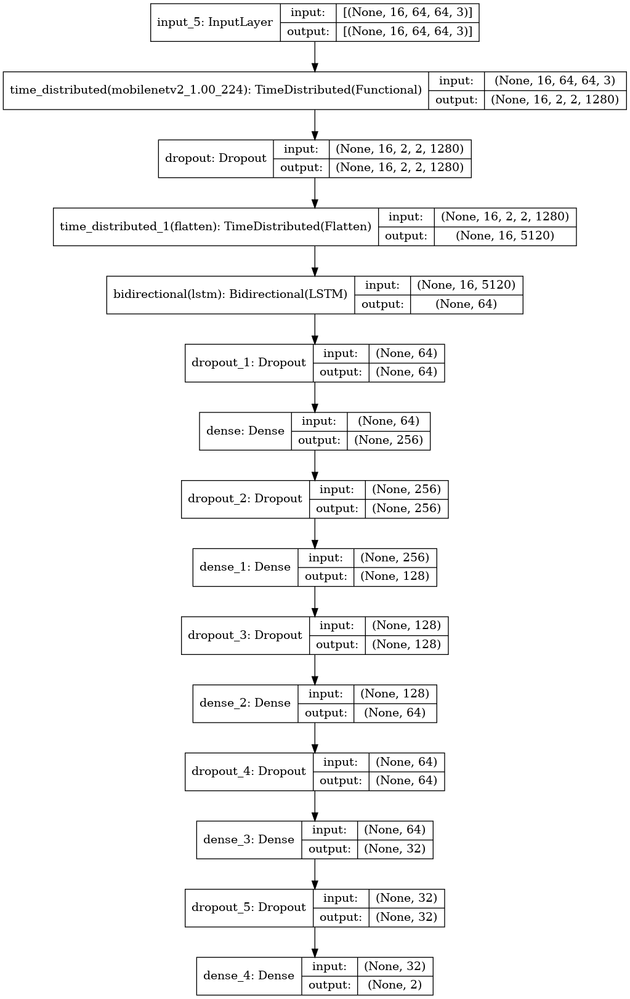

In [34]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

# **Specifying Callbacks and Fitting**

In [36]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
 
# Compiling the model 
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])
 
# Fitting the model 
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 30, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/30
180/180 [==============================] - 13s 45ms/step - loss: 0.1488 - accuracy: 0.9521 - val_loss: 0.2562 - val_accuracy: 0.9056
Epoch 2/30
180/180 [==============================] - 7s 37ms/step - loss: 0.1133 - accuracy: 0.9618 - val_loss: 0.3545 - val_accuracy: 0.8972
Epoch 3/30
180/180 [==============================] - 7s 36ms/step - loss: 0.1252 - accuracy: 0.9563 - val_loss: 0.2826 - val_accuracy: 0.9139
Epoch 4/30
180/180 [==============================] - 7s 36ms/step - loss: 0.1273 - accuracy: 0.9521 - val_loss: 0.4012 - val_accuracy: 0.8778
Epoch 5/30
180/180 [==============================] - 7s 36ms/step - loss: 0.0979 - accuracy: 0.9667 - val_loss: 0.3848 - val_accuracy: 0.8917
Epoch 6/30
180/180 [==============================] - 7s 36ms/step - loss: 0.0972 - accuracy: 0.9667 - val_loss: 0.3972 - val_accuracy: 0.8917

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.005999999865889549.
Epoch 7/30
180/180 [==============================] - 7s 37ms

In [2]:
#Save Model
MoBiLSTM_model.save("violence_detection_model.h5")

NameError: name 'MoBiLSTM_model' is not defined

In [40]:
#Load Model

from tensorflow.keras.models import load_model
loaded_model = load_model("violence_detection_model.h5")

loaded_model.summary()


In [42]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 2s 48ms/step - loss: 0.2024 - accuracy: 0.9550


# **Model Evaluation**

In [43]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

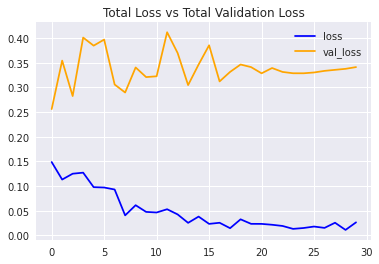

In [44]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

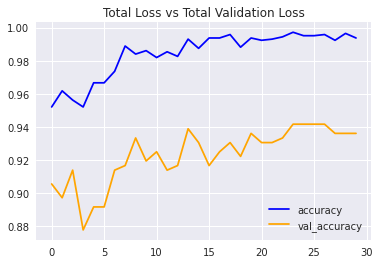

In [45]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

# **Predicting the Test Set**

In [46]:
labels_predict = MoBiLSTM_model.predict(features_test)

In [47]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [48]:
labels_test_normal.shape , labels_predict.shape

((200,), (200,))

Accuracy Score

In [49]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.955


Confusion Matrix

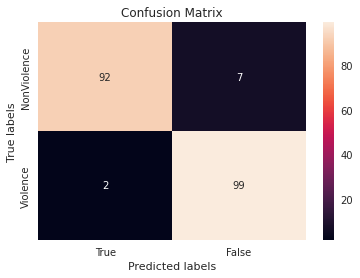

In [50]:
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

Classification Report

In [51]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      0.93      0.95        99
           1       0.93      0.98      0.96       101

    accuracy                           0.95       200
   macro avg       0.96      0.95      0.95       200
weighted avg       0.96      0.95      0.95       200



# **Prediction Frame By Frame**

In [57]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [58]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()

In [59]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

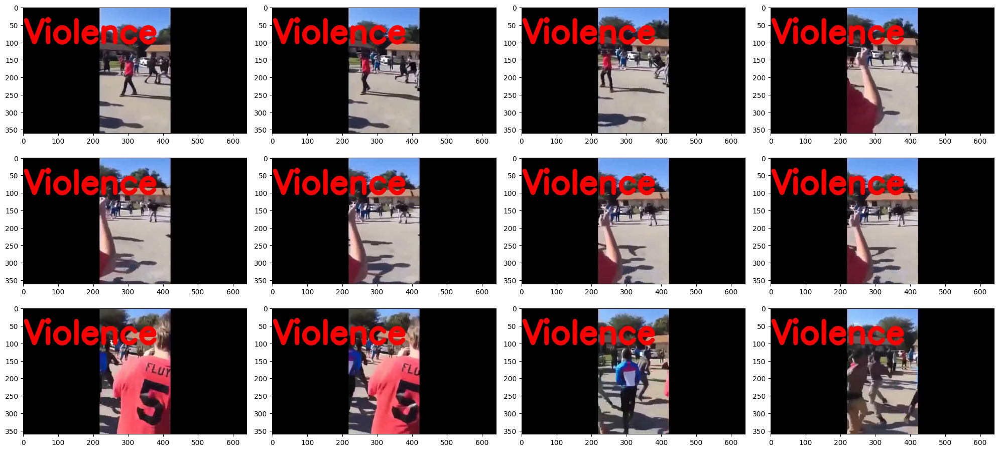

In [65]:
# Specifying video to be predicted - (given Violence video)
input_video_file_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_102.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [66]:
# Play the actual video
Play_Video(input_video_file_path)

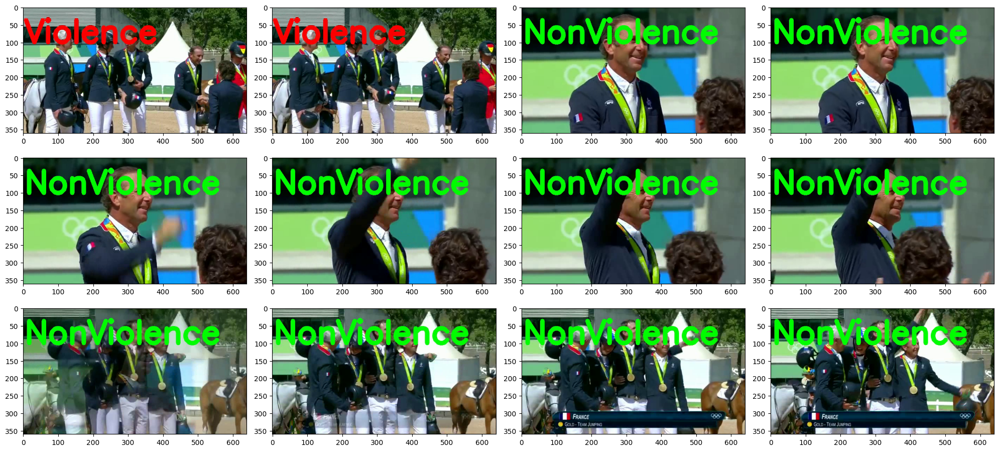

In [72]:
# Specifying video to be predicted- (given Non-Violence video)
input_video_file_path2 = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_202.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path2, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [73]:
# Play the actual video
Play_Video(input_video_file_path2)

# **Prediction For The Video**

In [75]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [77]:
# Specifying video to be predicted
input_video_file_path3 = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_10.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path3, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path3)

Predicted: Violence
Confidence: 0.9991959929466248


In [78]:
# Specifying video to be predicted
input_video_file_path4 = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_202.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path4, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path4)

Predicted: NonViolence
Confidence: 0.9999551773071289


----------------------------------------------------------------------------------------------

# Explainable AI

In [3]:
!pip install shap lime opencv-python tensorflow matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 64.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 19.4 MB/s eta 0:00:0000:01:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 89.5 MB/s eta 0:00:00:00:01
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.3.0
    Uninstalling typing_extensions-4.3.0:
      Successfully uninstalled typing_extensions-4.3.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: h5py
    Found existing installation: h5py 3.7.0
    Uninstalling h5py-3.7.0:
      Successfully uninstalled h5py-3.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.10.0
    Uninstalling tensorboard-2.10.0:
      Successfully uninstalled tensorboard-2.10.0
ERROR: pip's dependency resolver does not currently take into accoun

# Extracting Frames & Predicting Violence Per-Frame

In [6]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from collections import deque

# Load the trained model
loaded_model = load_model("/kaggle/input/violence_detection_model/keras/default/1/violence_detection_model.h5")

# Define sequence length
SEQUENCE_LENGTH = 10  # Number of frames to form a sequence

# Function to predict violence per sequence
def predict_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_queue = deque(maxlen=SEQUENCE_LENGTH)  # Store last N frames

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # Stop if video ends

        # Preprocess frame (resize to 64x64, normalize)
        frame_resized = cv2.resize(frame, (64, 64))
        frame_normalized = frame_resized / 255.0  # Normalize pixel values
        frame_queue.append(frame_normalized)  # Add to frame sequence

        # Make prediction only when enough frames are collected
        if len(frame_queue) == SEQUENCE_LENGTH:
            sequence_array = np.array(frame_queue)  # Convert to numpy array
            sequence_array = np.expand_dims(sequence_array, axis=0)  # Add batch dimension

            # Make prediction for this sequence
            prediction = loaded_model.predict(sequence_array)[0][0]  # Get probability
            label = "Violence" if prediction > 0.5 else "Non-Violence"

            print(f"Prediction: {label} (Confidence: {prediction:.2f})")

    cap.release()

# Example usage
video_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_202.mp4"
predict_video(video_path)


Prediction: Violence (Confidence: 0.97)
Prediction: Violence (Confidence: 0.79)
Prediction: Violence (Confidence: 0.71)
Prediction: Violence (Confidence: 0.86)
Prediction: Violence (Confidence: 0.81)
Prediction: Violence (Confidence: 0.81)
Prediction: Violence (Confidence: 0.51)
Prediction: Violence (Confidence: 0.64)
Prediction: Non-Violence (Confidence: 0.50)
Prediction: Violence (Confidence: 0.72)
Prediction: Violence (Confidence: 0.65)
Prediction: Non-Violence (Confidence: 0.27)
Prediction: Non-Violence (Confidence: 0.11)
Prediction: Non-Violence (Confidence: 0.01)
Prediction: Non-Violence (Confidence: 0.01)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Confidence: 0.00)
Prediction: Non-Violence (Co

In [2]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from collections import deque

# Load the trained model
loaded_model = load_model("/kaggle/input/violence_detection_model/keras/default/1/violence_detection_model.h5")

# Define sequence length
SEQUENCE_LENGTH = 10  # Number of frames to form a sequence

# Function to predict violence per sequence
def predict_video(video_path):
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print("Error: Unable to open video file.")
        return

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # Get total frame count
    print(f"Total frames in video: {total_frames}")

    frame_queue = deque(maxlen=SEQUENCE_LENGTH)  # Store last N frames
    frame_number = 0  # Track frame count

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # Stop if video ends

        frame_number += 1  # Increment frame number

        # Preprocess frame (resize to 64x64, normalize)
        frame_resized = cv2.resize(frame, (64, 64))
        frame_normalized = frame_resized / 255.0  # Normalize pixel values
        frame_queue.append(frame_normalized)  # Add to frame sequence

        # Make prediction only when enough frames are collected
        if len(frame_queue) == SEQUENCE_LENGTH:
            sequence_array = np.array(frame_queue)  # Convert to numpy array
            sequence_array = np.expand_dims(sequence_array, axis=0)  # Add batch dimension

            # Make prediction for this sequence
            prediction = loaded_model.predict(sequence_array)[0][0]  # Get probability
            label = "Violence" if prediction > 0.5 else "Non-Violence"

            print(f"Frame {frame_number}/{total_frames} | Prediction: {label} (Confidence: {prediction:.2f})")

    cap.release()

# Example usage
video_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_202.mp4"
predict_video(video_path)


Total frames in video: 113
Frame 10/113 | Prediction: Violence (Confidence: 0.97)
Frame 11/113 | Prediction: Violence (Confidence: 0.79)
Frame 12/113 | Prediction: Violence (Confidence: 0.71)
Frame 13/113 | Prediction: Violence (Confidence: 0.86)
Frame 14/113 | Prediction: Violence (Confidence: 0.81)
Frame 15/113 | Prediction: Violence (Confidence: 0.81)
Frame 16/113 | Prediction: Violence (Confidence: 0.51)
Frame 17/113 | Prediction: Violence (Confidence: 0.64)
Frame 18/113 | Prediction: Non-Violence (Confidence: 0.50)
Frame 19/113 | Prediction: Violence (Confidence: 0.72)
Frame 20/113 | Prediction: Violence (Confidence: 0.65)
Frame 21/113 | Prediction: Non-Violence (Confidence: 0.27)
Frame 22/113 | Prediction: Non-Violence (Confidence: 0.11)
Frame 23/113 | Prediction: Non-Violence (Confidence: 0.01)
Frame 24/113 | Prediction: Non-Violence (Confidence: 0.01)
Frame 25/113 | Prediction: Non-Violence (Confidence: 0.00)
Frame 26/113 | Prediction: Non-Violence (Confidence: 0.00)
Frame 27/1

In [3]:
import cv2
import numpy as np
import shap
import matplotlib.pyplot as plt
import os
import moviepy.video.io.ImageSequenceClip
from tensorflow.keras.models import load_model
from collections import deque

# Load the trained model
loaded_model = load_model("/kaggle/input/violence_detection_model/keras/default/1/violence_detection_model.h5")

# Define sequence length
SEQUENCE_LENGTH = 10  # Number of frames to form a sequence

# Initialize SHAP Explainer
explainer = shap.Explainer(loaded_model)

# Create output directory for SHAP plots
save_dir = "./shap_plots/"
os.makedirs(save_dir, exist_ok=True)

# Store SHAP values and frame data
shap_values_list = []
sequence_list = []
frame_numbers = []

# Function to predict violence per sequence with SHAP explanations
def predict_video_with_shap(video_path):
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print("Error: Unable to open video file.")
        return

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # Get total frame count
    print(f"Total frames in video: {total_frames}")

    frame_queue = deque(maxlen=SEQUENCE_LENGTH)  # Store last N frames
    frame_number = 0  # Track frame count

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # Stop if video ends

        frame_number += 1  # Increment frame number

        # Preprocess frame (resize to 64x64, normalize)
        frame_resized = cv2.resize(frame, (64, 64))
        frame_normalized = frame_resized / 255.0  # Normalize pixel values
        frame_queue.append(frame_normalized)  # Add to frame sequence

        # Make prediction only when enough frames are collected
        if len(frame_queue) == SEQUENCE_LENGTH:
            sequence_array = np.array(frame_queue)  # Convert to numpy array
            sequence_array = np.expand_dims(sequence_array, axis=0)  # Add batch dimension

            # Make prediction for this sequence
            prediction = loaded_model.predict(sequence_array)[0][0]  # Get probability
            label = "Violence" if prediction > 0.5 else "Non-Violence"

            print(f"Frame {frame_number}/{total_frames} | Prediction: {label} (Confidence: {prediction:.2f})")

            # Apply SHAP explanation
            shap_values = explainer(sequence_array)  # Compute SHAP values
            shap_values_list.append(shap_values.values)
            sequence_list.append(sequence_array)
            frame_numbers.append(frame_number)

            # Generate SHAP image plot
            plt.figure(figsize=(8, 4))
            shap.image_plot(shap_values.values, sequence_array)
            plt.title(f"SHAP Explanation for Frame {frame_number}")

            # Save SHAP plot
            shap_filename = f"{save_dir}shap_frame_{frame_number}.png"
            plt.savefig(shap_filename)
            plt.close()

            print(f"SHAP plot saved: {shap_filename}")

    cap.release()

    # Convert SHAP values list to numpy array
    shap_values_np = np.vstack(shap_values_list)
    
    # Generate SHAP Summary Plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values_np, np.vstack(sequence_list).reshape(len(sequence_list), -1))
    plt.title("SHAP Summary Plot (All Frames)")
    plt.savefig(f"{save_dir}shap_summary_plot.png")
    plt.close()

    # Generate SHAP Waterfall Plot for the first frame
    plt.figure(figsize=(10, 6))
    shap.waterfall_plot(shap_values_list[0])
    plt.title(f"SHAP Waterfall Plot (Frame {frame_numbers[0]})")
    plt.savefig(f"{save_dir}shap_waterfall_frame_{frame_numbers[0]}.png")
    plt.close()

    # Generate SHAP Force Plot
    shap.force_plot(
        explainer.expected_value[0], shap_values_list[0][0], sequence_list[0][0],
        matplotlib=True
    )
    plt.title(f"SHAP Force Plot (Frame {frame_numbers[0]})")
    plt.savefig(f"{save_dir}shap_force_frame_{frame_numbers[0]}.png")
    plt.close()

    # Create video of SHAP plots
    image_files = [f"{save_dir}shap_frame_{num}.png" for num in frame_numbers]
    video_filename = f"{save_dir}shap_video.mp4"

    clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(image_files, fps=5)
    clip.write_videofile(video_filename, codec="libx264")

    print(f"SHAP video saved: {video_filename}")

# Example usage
video_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_202.mp4"
predict_video_with_shap(video_path)


ModuleNotFoundError: No module named 'moviepy'